# <center> Dry bean Dataset</center>

## Importing Libraries

In [19]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings("ignore")

pd.set_option("display.max_rows", None)

from sklearn.model_selection import train_test_split

from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import BaggingClassifier,AdaBoostClassifier,GradientBoostingClassifier,RandomForestClassifier

from sklearn.svm import SVC
from xgboost import XGBClassifier

# !pip install xgboost

## Loading Dataset

In [20]:
data=pd.read_csv("https://raw.githubusercontent.com/rahulinchal/Finding-Best-Score-for-Dry-Beans-Dataset/main/Dry_Bean.csv")

In [21]:
data.head(10)

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,SEKER
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272751,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,SEKER
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,SEKER
3,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199,SEKER
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166,SEKER
5,30279,634.927,212.560556,181.510182,1.171067,0.520401,30600,196.347702,0.775688,0.989510,0.943852,0.923726,0.007020,0.003153,0.853270,0.999236,SEKER
6,30477,670.033,211.050155,184.039050,1.146768,0.489478,30970,196.988633,0.762402,0.984081,0.853080,0.933374,0.006925,0.003242,0.871186,0.999049,SEKER
7,30519,629.727,212.996755,182.737204,1.165591,0.513760,30847,197.124320,0.770682,0.989367,0.967109,0.925480,0.006979,0.003158,0.856514,0.998345,SEKER
8,30685,635.681,213.534145,183.157146,1.165852,0.514081,31044,197.659696,0.771561,0.988436,0.954240,0.925658,0.006959,0.003152,0.856844,0.998953,SEKER
9,30834,631.934,217.227813,180.897469,1.200834,0.553642,31120,198.139012,0.783683,0.990810,0.970278,0.912125,0.007045,0.003008,0.831973,0.999061,SEKER


## Outlier handling

<AxesSubplot:>

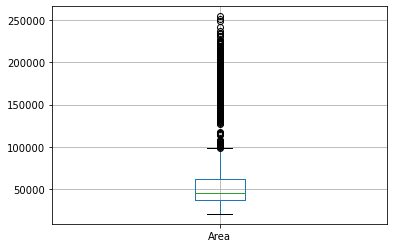

In [22]:
data.boxplot(['Area'])
# data['Area']

In [23]:
Q1 = data.quantile(0.25)
Q3 = data.quantile(0.75)
IQR = Q3 - Q1

print(IQR)

Area               25004.000000
Perimeter            273.689500
MajorAxisLength      123.191380
MinorAxisLength       41.183571
AspectRation           0.274802
Eccentricity           0.094538
ConvexArea         25579.500000
EquivDiameter         64.378463
Extent                 0.068218
Solidity               0.004343
roundness              0.084773
Compactness            0.071801
ShapeFactor1           0.001372
ShapeFactor2           0.001017
ShapeFactor3           0.114648
ShapeFactor4           0.004180
dtype: float64


In [24]:
data1 = data[~((data < (Q1 - 1.5 * IQR)) |(data > (Q3 + 1.5 * IQR))).any(axis=1)]
data1.head()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
23,31637,656.711,229.719255,175.510446,1.308864,0.645191,32045,200.702465,0.761823,0.987268,0.921842,0.873686,0.007261,0.002610,0.763327,0.999091,SEKER
24,31675,657.431,236.752632,171.210559,1.382816,0.690678,32009,200.822963,0.740936,0.989565,0.920929,0.848240,0.007474,0.002387,0.719510,0.994950,SEKER
29,31811,642.092,223.984683,180.917123,1.238051,0.589565,32052,201.253629,0.773877,0.992481,0.969600,0.898515,0.007041,0.002831,0.807329,0.999515,SEKER
31,31823,662.532,222.872689,181.894696,1.225284,0.577858,32274,201.291585,0.774848,0.986026,0.911040,0.903168,0.007004,0.002875,0.815713,0.999481,SEKER
32,31837,656.404,224.912554,180.439422,1.246471,0.596968,32238,201.335857,0.785246,0.987561,0.928538,0.895174,0.007065,0.002798,0.801336,0.998843,SEKER


In [25]:
data2=data.clip(lower=data.quantile(0.04), upper=data.quantile(0.96),axis=1)

data2.drop("Class",1,inplace=True)
data2['Class']=data['Class']

data2.head()
data2.shape

(13611, 17)

## EDA

In [26]:
data.describe()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4
count,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000
mean,53048.284549,855.283459,320.141867,202.270714,1.583242,0.750895,53768.200206,253.064220,0.749733,0.987143,0.873282,0.799864,0.006564,0.001716,0.643590,0.995063
std,29324.095717,214.289696,85.694186,44.970091,0.246678,0.092002,29774.915817,59.177120,0.049086,0.004660,0.059520,0.061713,0.001128,0.000596,0.098996,0.004366
min,20420.000000,524.736000,183.601165,122.512653,1.024868,0.218951,20684.000000,161.243764,0.555315,0.919246,0.489618,0.640577,0.002778,0.000564,0.410339,0.947687
25%,36328.000000,703.523500,253.303633,175.848170,1.432307,0.715928,36714.500000,215.068003,0.718634,0.985670,0.832096,0.762469,0.005900,0.001154,0.581359,0.993703
50%,44652.000000,794.941000,296.883367,192.431733,1.551124,0.764441,45178.000000,238.438026,0.759859,0.988283,0.883157,0.801277,0.006645,0.001694,0.642044,0.996386
75%,61332.000000,977.213000,376.495012,217.031741,1.707109,0.810466,62294.000000,279.446467,0.786851,0.990013,0.916869,0.834270,0.007271,0.002170,0.696006,0.997883
max,254616.000000,1985.370000,738.860154,460.198497,2.430306,0.911423,263261.000000,569.374358,0.866195,0.994677,0.990685,0.987303,0.010451,0.003665,0.974767,0.999733


In [27]:
data.shape

(13611, 17)

In [28]:
data.replace(['SIRA','BOMBAY','DERMASON', 'BARBUNYA', 'HOROZ', 'CALI', 'SEKER',], [1,2,3,4,5,6,0], inplace=True)

In [29]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13611 entries, 0 to 13610
Data columns (total 17 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Area             13611 non-null  int64  
 1   Perimeter        13611 non-null  float64
 2   MajorAxisLength  13611 non-null  float64
 3   MinorAxisLength  13611 non-null  float64
 4   AspectRation     13611 non-null  float64
 5   Eccentricity     13611 non-null  float64
 6   ConvexArea       13611 non-null  int64  
 7   EquivDiameter    13611 non-null  float64
 8   Extent           13611 non-null  float64
 9   Solidity         13611 non-null  float64
 10  roundness        13611 non-null  float64
 11  Compactness      13611 non-null  float64
 12  ShapeFactor1     13611 non-null  float64
 13  ShapeFactor2     13611 non-null  float64
 14  ShapeFactor3     13611 non-null  float64
 15  ShapeFactor4     13611 non-null  float64
 16  Class            13611 non-null  int64  
dtypes: float64(1

In [30]:
data.isnull().sum()

Area               0
Perimeter          0
MajorAxisLength    0
MinorAxisLength    0
AspectRation       0
Eccentricity       0
ConvexArea         0
EquivDiameter      0
Extent             0
Solidity           0
roundness          0
Compactness        0
ShapeFactor1       0
ShapeFactor2       0
ShapeFactor3       0
ShapeFactor4       0
Class              0
dtype: int64

<AxesSubplot:>

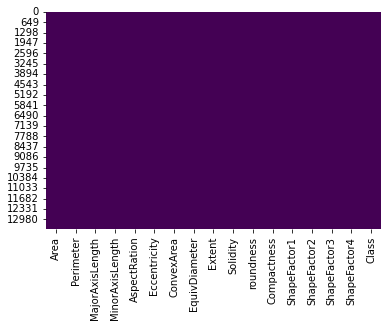

In [31]:
sns.heatmap(data.isnull(),cbar=False,cmap='viridis')

<AxesSubplot:>

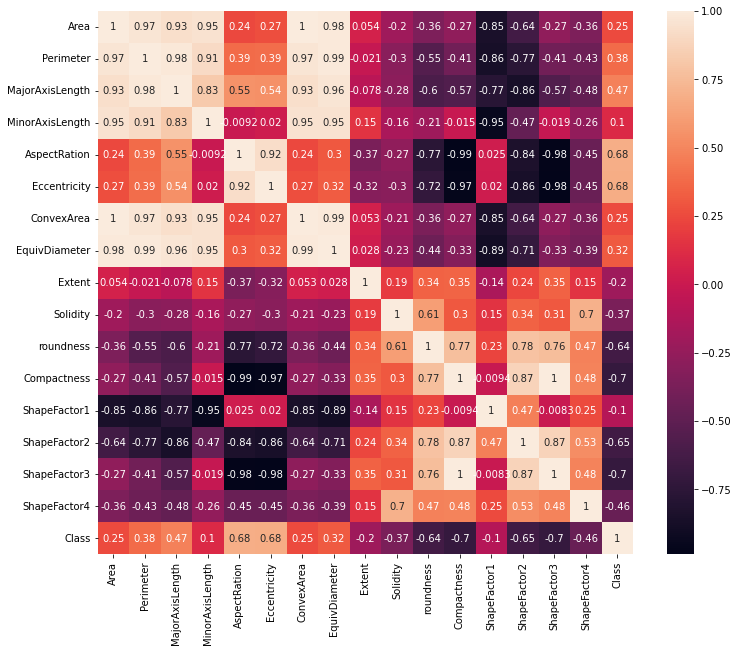

In [32]:
plt.figure(figsize=(12,10))
sns.heatmap(data=data.corr(),annot=True)

[Text(0.5, 1.0, 'Box Plot of columns')]

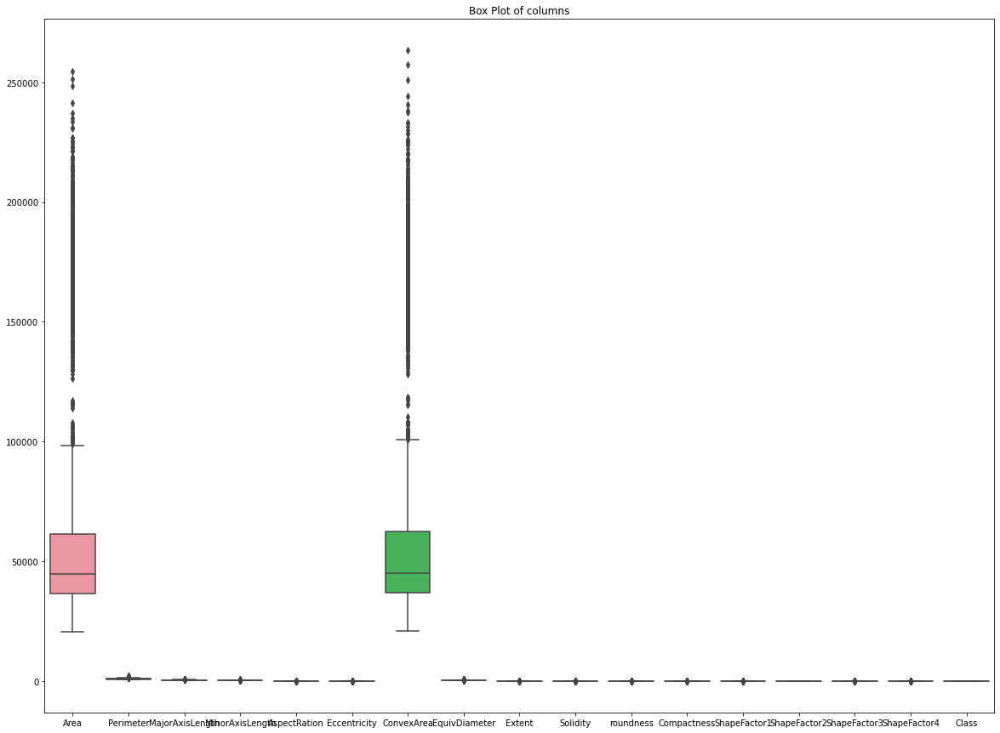

In [33]:
plt.figure(figsize=(20,15))
sns.boxplot(data=data).set(title="Box Plot of columns")

In [34]:
data['Class'].unique()

array([0, 4, 2, 6, 5, 1, 3], dtype=int64)

## Removal of outliers

In [41]:
def remove_outlier(col):

    for i in col:
        sorted(col[i])
        Q1,Q3=col[i].quantile([0.25,0.75])
        IQR=Q3-Q1
        lower_range=Q3-(1.5*IQR)
        upper_range=Q3+(1.5*IQR)
        print(lower_range,upper_range)
        

x = data.loc[:,data.columns!='Class']
remove_outlier(x)

23826.0 98838.0
566.67875 1387.74725
191.70794282499998 561.2820820750001
155.25638442499996 278.8070981750001
1.2949059337499997 2.1193119202500004
0.6686586269999999 0.9522733410000002
23924.75 100663.25
182.878771825 376.01416157499995
0.684524543 0.88917845
0.9834990427499999 0.9965271772500002
0.7897100770000001 1.044027589
0.726568165 0.9419716570000001
0.0052141654999999995 0.009328674500000002
0.0006451459999999999 0.00369539
0.5240347437500001 0.8679778242499998
0.99161307175 1.00415201425


In [42]:
def remove_outlier(col):
    sorted(col)
    Q1,Q3=col.quantile([0.25,0.75])
    IQR=Q3-Q1
    lower_range=Q3-(1.5*IQR)
    upper_range=Q3+(1.5*IQR)
    return lower_range,upper_range
z=data.loc[:,data.columns!='Class']
for i in z:
    low_lead_time,up_lead_time=remove_outlier(z[i])
    data[i]=np.where(data[i]>up_lead_time,up_lead_time,data[i])
    data[i]=np.where(data[i]<low_lead_time,low_lead_time,data[i])
    
    


<AxesSubplot:>

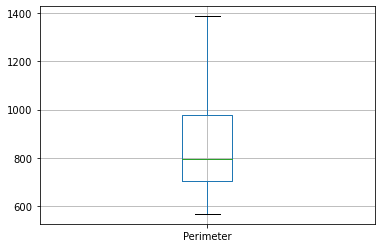

In [43]:
data.boxplot(['Perimeter'])

[Text(0.5, 1.0, 'Box Plot of columns')]

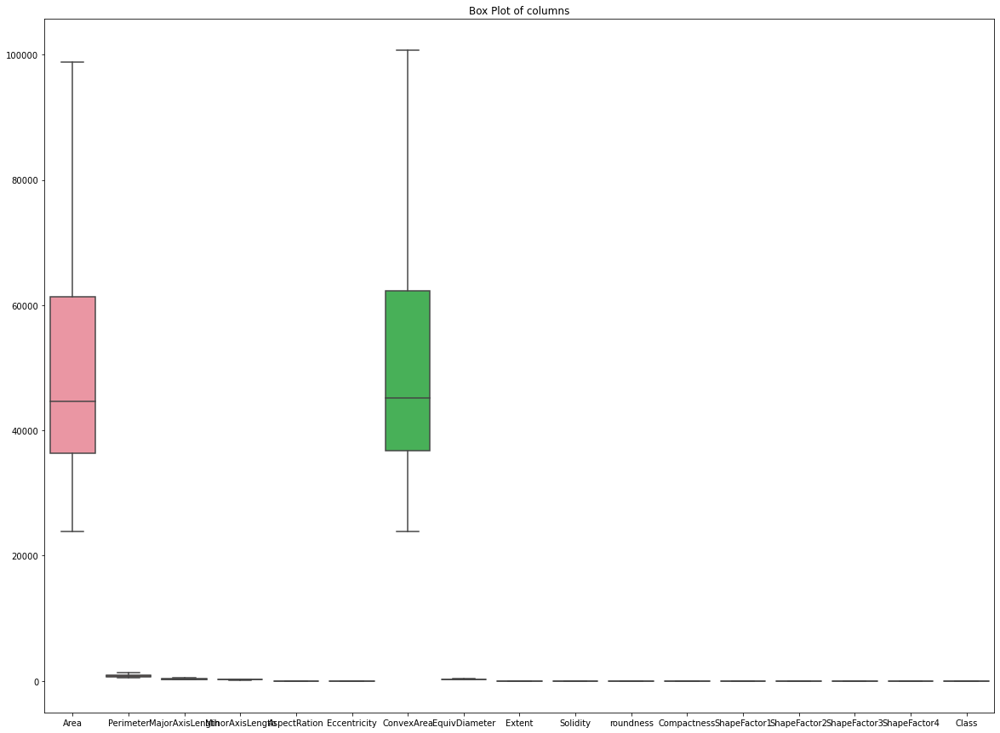

In [44]:
plt.figure(figsize=(20,15))
sns.boxplot(data=data).set(title="Box Plot of columns")

## Data visualization

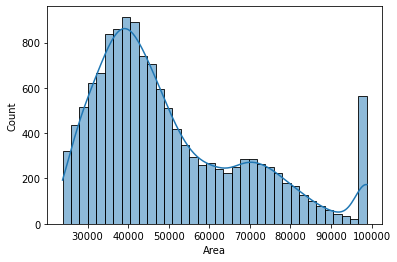

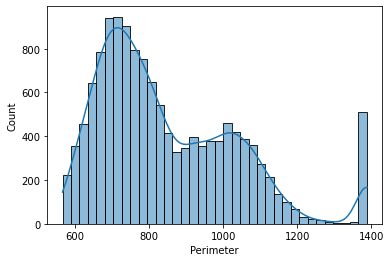

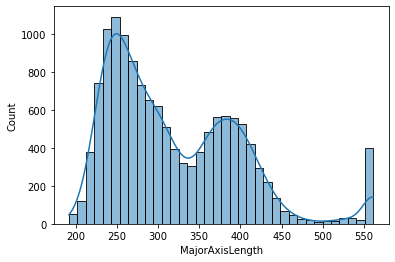

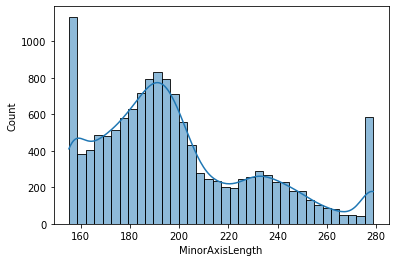

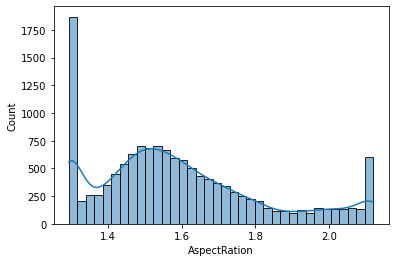

...

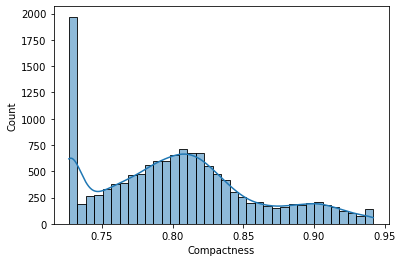

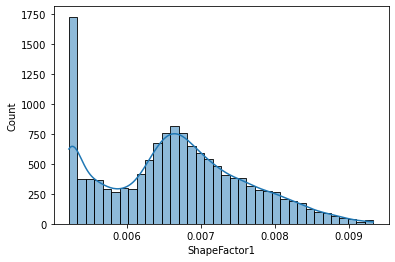

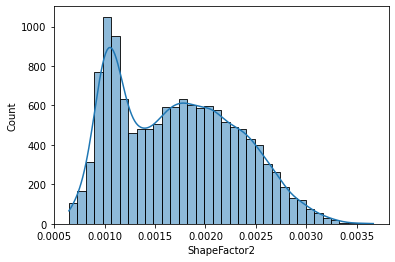

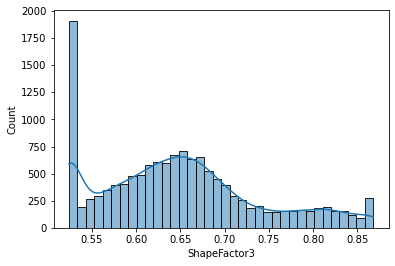

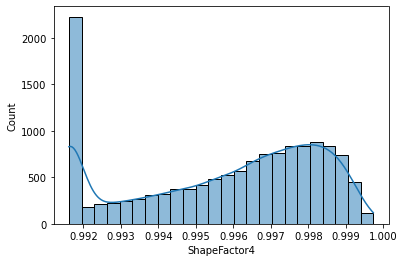

None


In [45]:
x=data.loc[:,data.columns!='Class']
# x.head()
def dist(x):
    for i in x:
        sns.histplot(x[i],kde=True)
        plt.show()
print(dist(x))

<AxesSubplot:xlabel='Class', ylabel='count'>

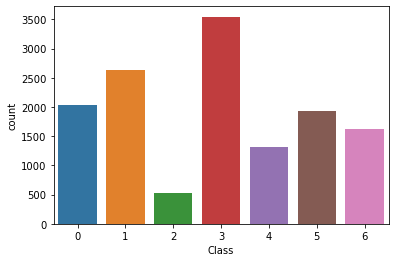

In [46]:
sns.countplot("Class",data=data)

In [47]:
data["Class"].value_counts()

3    3546
1    2636
0    2027
5    1928
6    1630
4    1322
2     522
Name: Class, dtype: int64

<AxesSubplot:xlabel='Area', ylabel='EquivDiameter'>

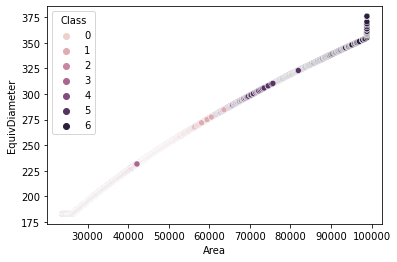

In [48]:
sns.scatterplot('Area','EquivDiameter',hue='Class',data=data)

<AxesSubplot:xlabel='Area', ylabel='ShapeFactor2'>

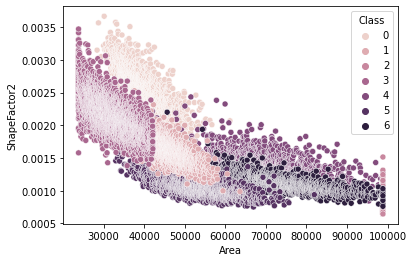

In [49]:
sns.scatterplot('Area','ShapeFactor2',hue='Class',data=data)

<AxesSubplot:xlabel='Area', ylabel='ShapeFactor4'>

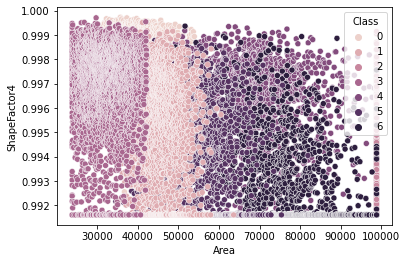

In [50]:
sns.scatterplot('Area','ShapeFactor4',hue='Class',data=data)

<AxesSubplot:xlabel='Area', ylabel='Solidity'>

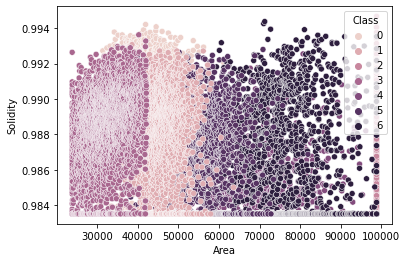

In [51]:
sns.scatterplot('Area','Solidity',hue='Class',data=data)

__Shapefactor3/4 and Solidity have similar relations with area of beans__

<AxesSubplot:xlabel='Area', ylabel='roundness'>

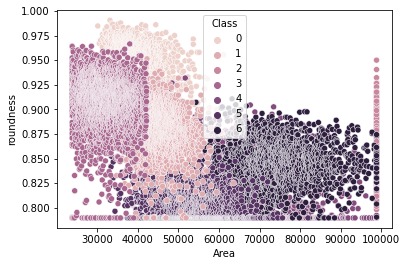

In [52]:
sns.scatterplot('Area','roundness',hue='Class',data=data)

<AxesSubplot:xlabel='Area', ylabel='Compactness'>

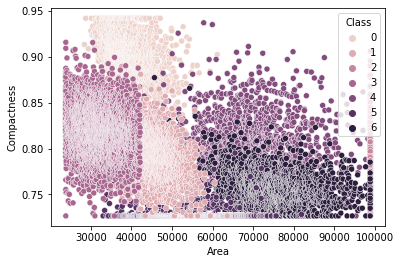

In [53]:
sns.scatterplot('Area','Compactness',hue='Class',data=data)

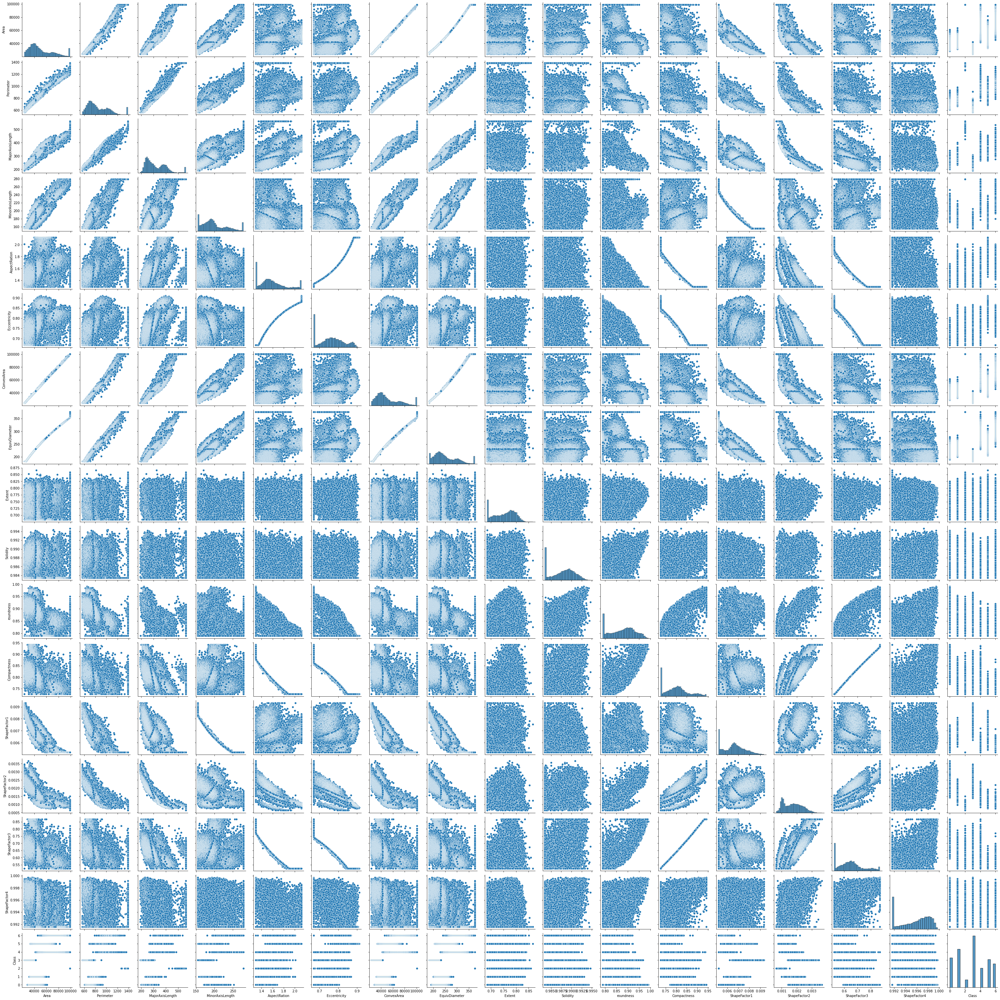

In [54]:
sns.pairplot(data)

## Data Modelling

In [ ]:
def split(x,y):
    
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.30,random_state=1)
#     print("Shape of x_train is:",x_train.shape,"; Shape of x_test is:" ,x_test.shape)
#     print("Shape of y_train is:",y_train.shape,"; Shape of y_test is:" ,y_test.shape)
    models={
    "LogisticRegression":LogisticRegression(penalty='l1',class_weight='balanced',solver='liblinear'),
    "DecisionTreeClassifier":DecisionTreeClassifier(criterion='gini',max_depth=6,random_state=1,class_weight='balanced'),
    "KNeighborsClassifier":KNeighborsClassifier(n_neighbors=28,p=1,n_jobs=1),
    "GaussianNB":GaussianNB(),
    "BaggingClassifier":BaggingClassifier(n_estimators=35,max_samples=30),
    "AdaBoostClassifier":AdaBoostClassifier(n_estimators=80,learning_rate=5,random_state=1),
    "GradientBoostingClassifier":GradientBoostingClassifier(n_estimators=450),
    "RandomForestClassifier":RandomForestClassifier(n_estimators=500,random_state=1,max_samples=21),
    "Support vector classifier":SVC(class_weight='balanced',),
    "XGBClassifier":XGBClassifier()    
    }
    for name,model in models.items():
        model.fit(x_train,y_train)
        y_pred_train = model.predict(x_train)
        y_pred_test = model.predict(x_test)
#         confusion_matrix_of_test_data = pd.DataFrame(confusion_matrix(y_test, y_pred_test))
#         confusion_matrix_of_train_data = pd.DataFrame(confusion_matrix(y_train, y_pred_train))

        print('Accuracy score for test data is:', accuracy_score(y_test,y_pred_test))
        print(name,"test score is: ",model.score(x_test,y_test))
        print('Accuracy score for train data is:', accuracy_score(y_train,y_pred_train))
        print(name,"train score is: ",model.score(x_train,y_train))
        print("---------------------------------------------------------------------------------")

   



x=data.loc[:,data.columns!='Class']
y=data.loc[:,'Class']
split(x,y) 



Accuracy score for test data is: 0.8983839373163565
LogisticRegression test score is:  0.8983839373163565
Accuracy score for train data is: 0.8992337566915083
LogisticRegression train score is:  0.8992337566915083
---------------------------------------------------------------------------------
Accuracy score for test data is: 0.9027913809990206
DecisionTreeClassifier test score is:  0.9027913809990206
Accuracy score for train data is: 0.9095203106959169
DecisionTreeClassifier train score is:  0.9095203106959169
---------------------------------------------------------------------------------
Accuracy score for test data is: 0.7321253672869735
KNeighborsClassifier test score is:  0.7321253672869735
Accuracy score for train data is: 0.7594205941009762
KNeighborsClassifier train score is:  0.7594205941009762
---------------------------------------------------------------------------------
Accuracy score for test data is: 0.7708129285014691
GaussianNB test score is:  0.7708129285014691
Ac

## Conclusion

__The best fit model is Random forest, Bagging classifier and logistic regression we can tune some models and increase the performance and choose the best fit__